In [1]:
# Installing dependencies using pip
!pip3 install numpy matplotlib opencv-python

In [2]:
# Importing libraries
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import math
import cv2
%matplotlib inline

## Pipeline Demonstration
1. The List of images from the `images` folder is read
2. Each Image in the folder undergoes a series of visual manipulation to remove the background and extract only the white and yellow lane lines. The pipeline is as follows
    - Colour Masking
    - Remove Noise from the Masked image
    - Apply Canny algorithm to find edges of the lane lines
    - Hough Lines is a predefined way to trace lines along the image between two points
    - Merge the Final result with the original image

NOTE: During Demo, execute each cell to show the lifecycle of how an image changes.

In [5]:
imageDir = 'images/'
imageFiles = os.listdir(imageDir)
imageList = []
for i in range(0, len(imageFiles)):
    imageList.append(mpimg.imread(imageDir + imageFiles[i]))
print(imageFiles)

['whitec.jpg', 'whitelane.jpg', 'whiter.jpg', 'yellowc.jpg', 'yellowc2.jpg', 'yellowl.jpg']


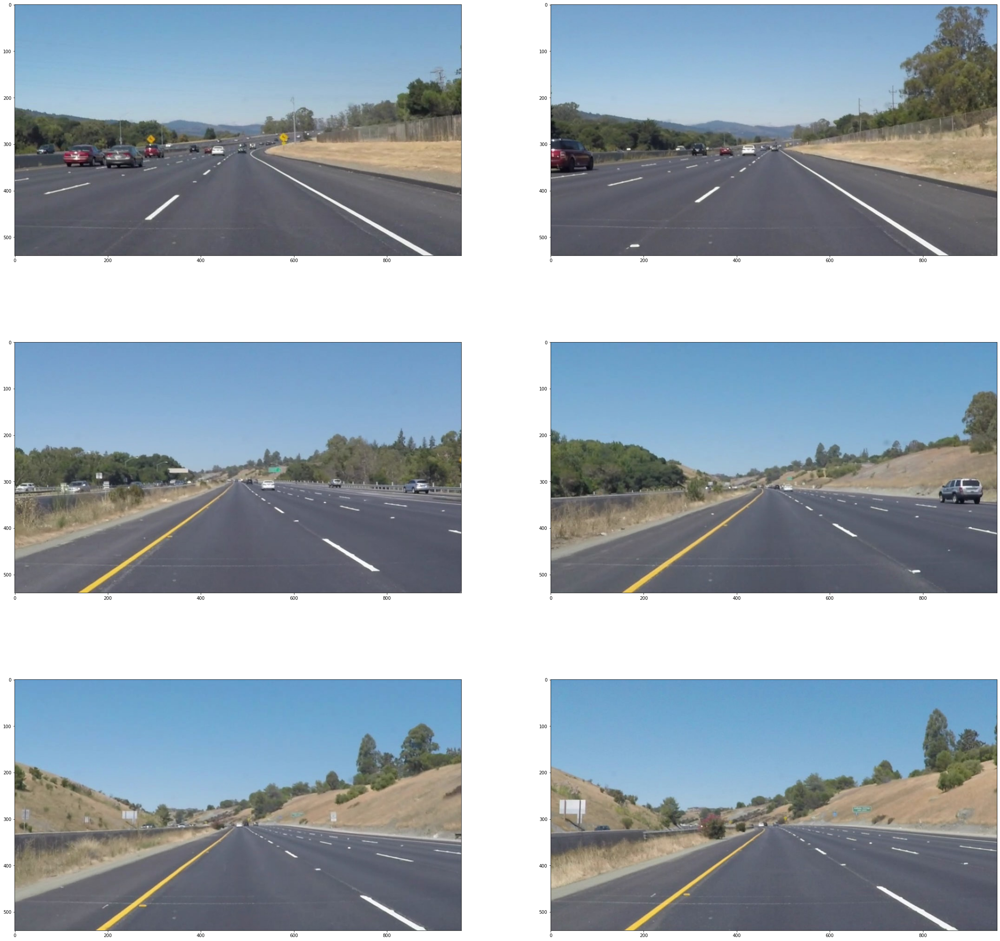

In [4]:
def show_images(images, cmap=None):
    plt.figure(figsize=(40,40))    
    for i, image in enumerate(images):
        plt.subplot(3,2,i+1)
        plt.imshow(image, cmap)
        plt.autoscale()
    plt.show()
    
show_images(imageList)

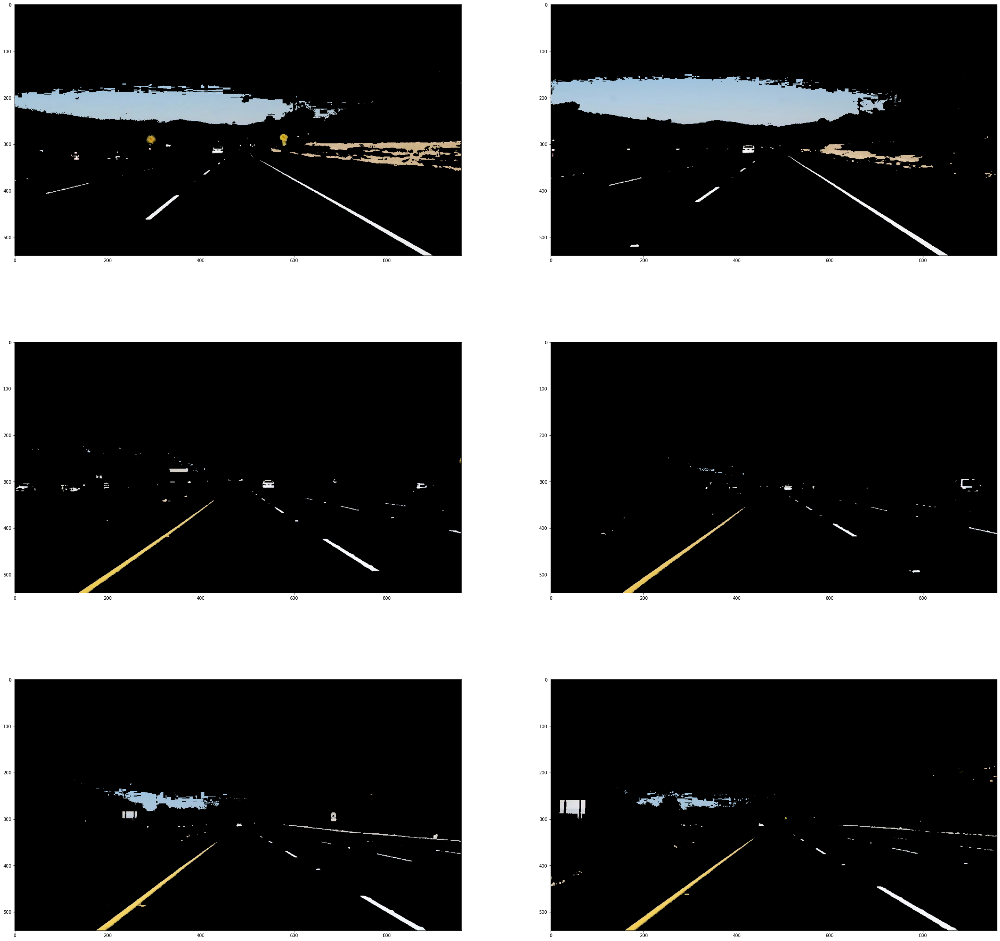

In [5]:
# Color Masking function
def color_filter(image):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    lower = np.array([0,190,0])
    upper = np.array([255,255,255])
    
    yellower = np.array([10,0,90])
    yelupper = np.array([50,255,255])
    
    yellowmask = cv2.inRange(hls, yellower, yelupper)    
    whitemask = cv2.inRange(hls, lower, upper)
    
    mask = cv2.bitwise_or(yellowmask, whitemask)  
    masked = cv2.bitwise_and(image, image, mask = mask)    
    


    return masked

filtered_img = list(map(color_filter, imageList))

show_images(filtered_img)

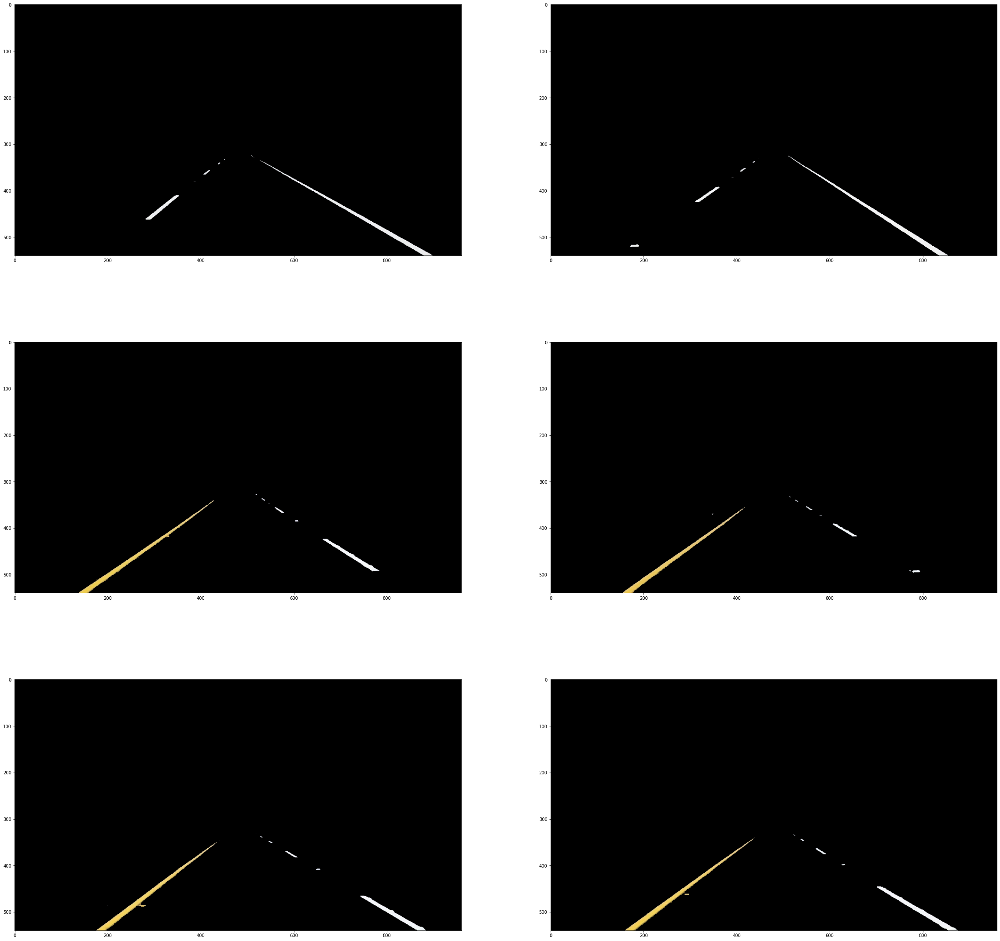

In [6]:
# After the color masking, the picture now contains only the white and yellow colors. This function identifies the region of interest.
def roi(img):
    x = int(img.shape[1])
    y = int(img.shape[0])
    shape = np.array([[int(0), int(y)], [int(x), int(y)], [int(0.55*x), int(0.6*y)], [int(0.45*x), int(0.6*y)]])

    
    mask = np.zeros_like(img)

    
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255

    
    cv2.fillPoly(mask, np.int32([shape]), ignore_mask_color)

    
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

roi_img = list(map(roi, filtered_img))

show_images(roi_img)

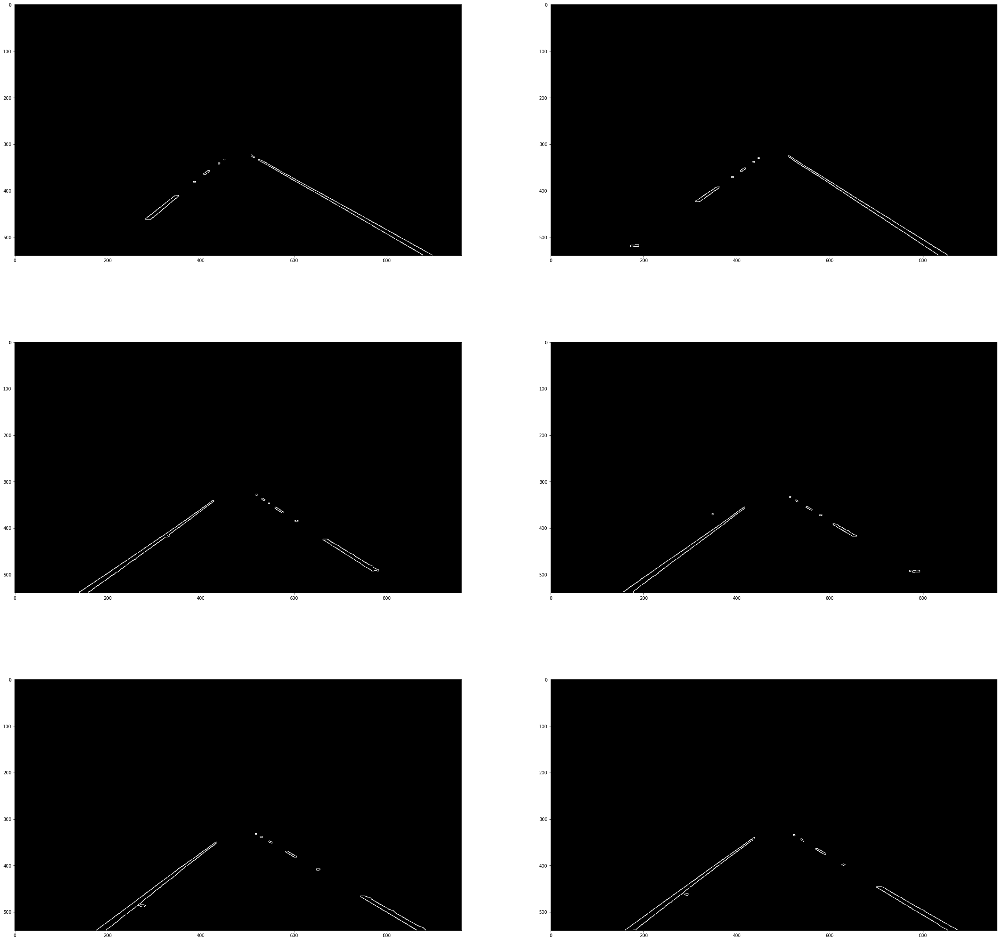

In [7]:
# Applying Gaussian blur and extracting only the edges from the lane lines by using Canny method

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
def gaussian_blur(img):
    return cv2.GaussianBlur(grayscale(img), (5,5), 0)

def canny(img):
    return cv2.Canny(gaussian_blur(img), 50, 120)

canny_img = list(map(canny, roi_img))
show_images(canny_img,cmap='gray')

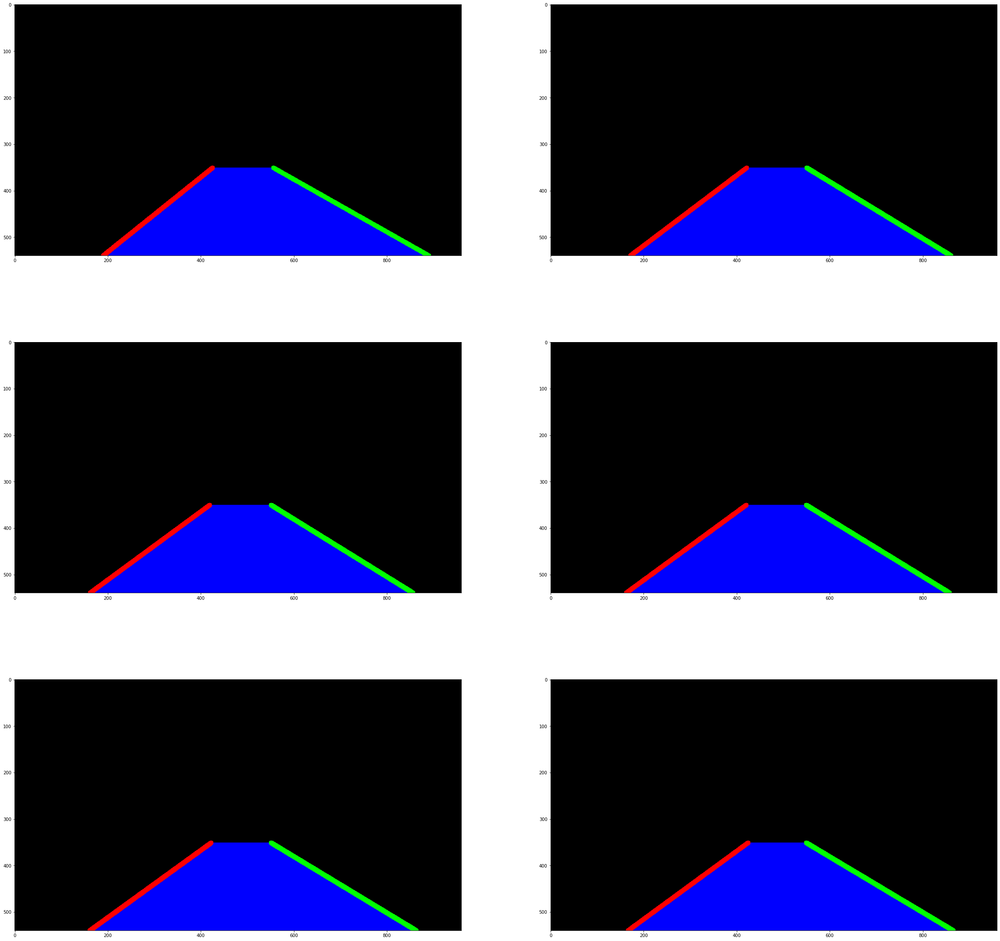

In [8]:
# Now applying Hough Transformation, we detect the intercept and the region of the two lines and 

rightSlope, leftSlope, rightIntercept, leftIntercept = [],[],[],[]
def draw_lines(img, lines, thickness=5):
    global rightSlope, leftSlope, rightIntercept, leftIntercept
    rightColor=[0,255,0]
    leftColor=[255,0,0]
    
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = (y1-y2)/(x1-x2)
            if slope > 0.3:
                if x1 > 500 :
                    yintercept = y2 - (slope*x2)                    
                    rightSlope.append(slope)
                    rightIntercept.append(yintercept)
                else: None                
            elif slope < -0.3:
                if x1 < 600:
                    yintercept = y2 - (slope*x2)                    
                    leftSlope.append(slope)
                    leftIntercept.append(yintercept)    
                    
                    
    
    leftavgSlope = np.mean(leftSlope[-30:])
    leftavgIntercept = np.mean(leftIntercept[-30:])
    
    rightavgSlope = np.mean(rightSlope[-30:])
    rightavgIntercept = np.mean(rightIntercept[-30:])
    
    
    
    try:
        left_line_x1 = int((0.65*img.shape[0] - leftavgIntercept)/leftavgSlope)
        left_line_x2 = int((img.shape[0] - leftavgIntercept)/leftavgSlope)
    
        right_line_x1 = int((0.65*img.shape[0] - rightavgIntercept)/rightavgSlope)
        right_line_x2 = int((img.shape[0] - rightavgIntercept)/rightavgSlope)

        pts = np.array([[left_line_x1, int(0.65*img.shape[0])],[left_line_x2, int(img.shape[0])],[right_line_x2, int(img.shape[0])],[right_line_x1, int(0.65*img.shape[0])]], np.int32)
        pts = pts.reshape((-1,1,2))
        cv2.fillPoly(img,[pts],(0,0,255))      
        
        
        cv2.line(img, (left_line_x1, int(0.65*img.shape[0])), (left_line_x2, int(img.shape[0])), leftColor, 10)
        cv2.line(img, (right_line_x1, int(0.65*img.shape[0])), (right_line_x2, int(img.shape[0])), rightColor, 10)
    except ValueError:
            
        pass
    
    
    
                
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

def linedetect(img):
    return hough_lines(img, 1, np.pi/180, 10, 20, 100)

hough_img = list(map(linedetect, canny_img))
show_images(hough_img)

Merging output from the last pipeline hough line into the original image.

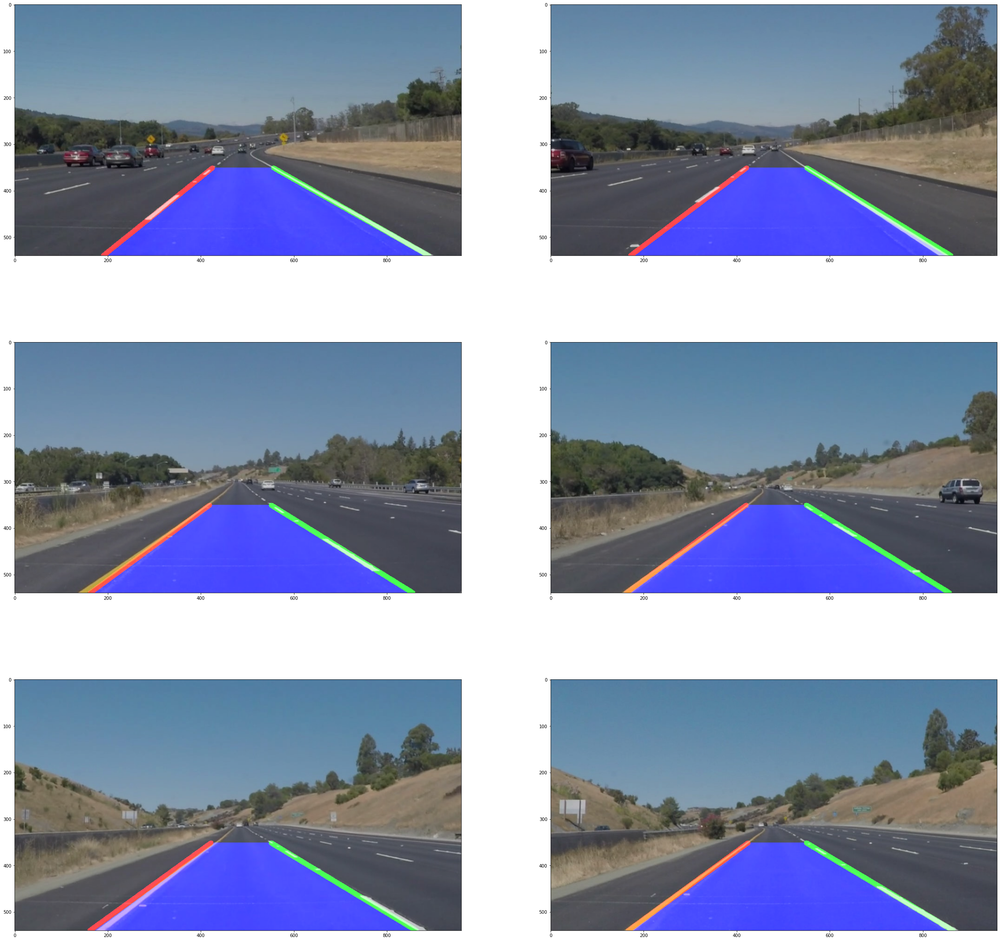

In [9]:
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    
    return cv2.addWeighted(initial_img, α, img, β, λ)

def weightSum(input_set):
    img = list(input_set)
    return cv2.addWeighted(img[0], 1, img[1], 0.8, 0)

result_img = list(map(weightSum, zip(hough_img, imageList)))
show_images(result_img)

Demo of Single image
- TO input a single image and view the final result.

NOTE: 
1. Add the image you want to view the results for into the `demo_images` folder. USE only JPG extension files
2. Change the name of the file in the code


Original Dimensions :  (540, 960, 3)
Resized Dimensions :  (540, 960, 3)


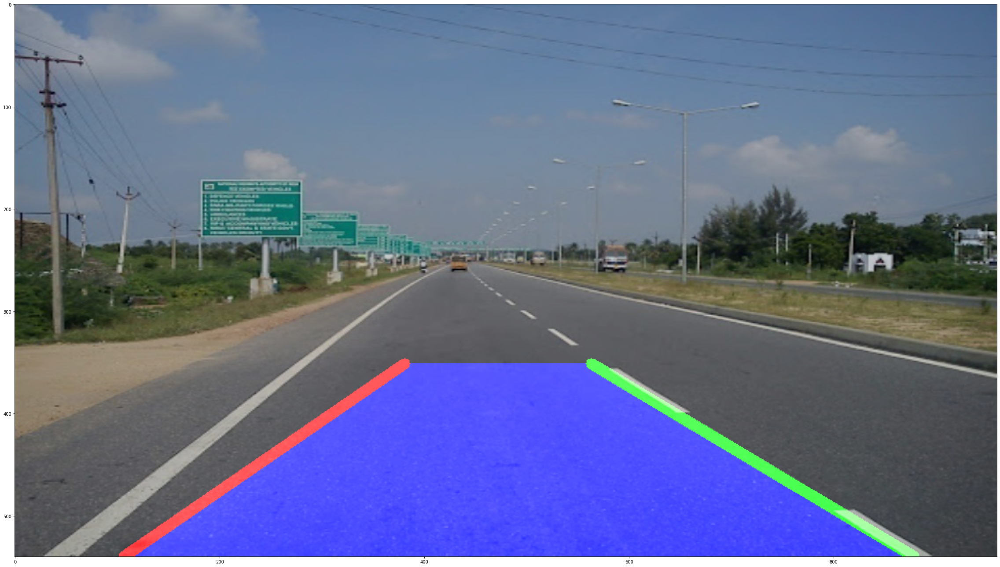

In [10]:
demo_image = "highway.jpg" #Name of the image
im = cv2.imread('demo_images/'+demo_image)
print('Original Dimensions : ',im.shape)
width=960
height=540
res = cv2.resize(im,(width,height))
print('Resized Dimensions : ',res.shape)
cv2.imwrite("demo_images/"+demo_image,res)

demoimageDir = 'demo_images/'
demoimage=(mpimg.imread(demoimageDir + demo_image))
colorfilter = color_filter(demoimage)
roiimg = roi(colorfilter)
cannyimg = canny(roiimg)
houghimg = linedetect(cannyimg)
result = list(map(weightSum, zip(houghimg, demoimage)))
plt.figure(figsize=(40,40))    
plt.imshow(result)

plt.autoscale()
plt.show()


In [11]:
!pip3 install moviepy

In [12]:
# Importing the libraries needed for creating and editing videos
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [13]:
# This function takes an image frame by frame and feeds it into the lane detection pipeline
def processImage(image):
    interest = roi(image)
    filterimg = color_filter(interest)
    canny = cv2.Canny(grayscale(filterimg), 50, 120)
    myline = hough_lines(canny, 1, np.pi/180, 10, 20, 5)
    weighted_img = cv2.addWeighted(myline, 1, image, 0.8, 0)
    
    return weighted_img

In [14]:
# Output directories
output1 = 'videos_output/output1.mp4'
output2 = 'videos_output/output2.mp4'
output3 = 'videos_output/output3.mp4'

# Import video files
clip1 = VideoFileClip("videos/video1.mp4")
clip2 = VideoFileClip("videos/video2.mp4")
clip3 = VideoFileClip("videos/video3.mp4")

# Extracting frames from the image and passing it to the pipeline
pclip1 = clip1.fl_image(processImage)
pclip2 = clip2.fl_image(processImage)
pclip3 = clip3.fl_image(processImage)

# Merging all the frames into a video based on their time stamps
%time pclip1.write_videofile(output1, audio=False)
%time pclip2.write_videofile(output2, audio=False)
%time pclip3.write_videofile(output3, audio=False)



Moviepy - Building video videos_output/output1.mp4.
Moviepy - Writing video videos_output/output1.mp4



Moviepy - Done !
Moviepy - video ready videos_output/output1.mp4
CPU times: user 22.5 s, sys: 5.97 s, total: 28.5 s
Wall time: 11.4 s
Moviepy - Building video videos_output/output2.mp4.
Moviepy - Writing video videos_output/output2.mp4



Moviepy - Done !
Moviepy - video ready videos_output/output2.mp4
CPU times: user 8.77 s, sys: 2.44 s, total: 11.2 s
Wall time: 5.06 s
Moviepy - Building video videos_output/output3.mp4.
Moviepy - Writing video videos_output/output3.mp4



Moviepy - Done !
Moviepy - video ready videos_output/output3.mp4
CPU times: user 15.2 s, sys: 3.98 s, total: 19.2 s
Wall time: 11.5 s


In [15]:
HTML("""
<h1>output1.mp4</h1><video width="960" height="540" controls>
<source src="{0}">
</video>
""".format(output1))

In [16]:
HTML("""
<h1>output2.mp4</h1><video width="960" height="540" controls>
<source src="{0}">
</video>
""".format(output2))

In [17]:
HTML("""
<h1>output3.mp4</h1><video width="960" height="540" controls>
<source src="{0}">
</video>
""".format(output3))